In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Data processing

In [2]:
df = pd.read_csv("google_review_ratings.csv", index_col = "User" )

In [3]:
df.head()

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
User,,,,,,,,,,,,,,,,,,,,,
User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN


In [4]:
df = df.drop("Unnamed: 25", axis=1)    #drop empty column

In [5]:
df.head()

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,...,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24
User,,,,,,,,,,,,,,,,,,,,,
User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0


In [6]:
df.columns = ["churches", "resorts", "beaches", "parks", "theatres", "museums", "malls", "zoo", "restaurants",
            "pubs_bars", "local_services", "burger_pizza", "hotels_other", "juice_bars", "art_galleries",
            "dance_clubs", "swimming_pools", "gyms", "bakeries", "beauty&spas", "cafes", "view_points", "monuments", 
             "gardens"]

In [7]:
df.columns

Index(['churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums',
       'malls', 'zoo', 'restaurants', 'pubs_bars', 'local_services',
       'burger_pizza', 'hotels_other', 'juice_bars', 'art_galleries',
       'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 'beauty&spas',
       'cafes', 'view_points', 'monuments', 'gardens'],
      dtype='object')

檢查有無空值

In [8]:
df.isnull().sum()

churches          0
resorts           0
beaches           0
parks             0
theatres          0
museums           0
malls             0
zoo               0
restaurants       0
pubs_bars         0
local_services    0
burger_pizza      1
hotels_other      0
juice_bars        0
art_galleries     0
dance_clubs       0
swimming_pools    0
gyms              0
bakeries          0
beauty&spas       0
cafes             0
view_points       0
monuments         0
gardens           1
dtype: int64

將有空值那整列資料當成錯誤資料去除不用

In [9]:
def DataCheck(df):
    for row in df.index:
        if df.loc[row, :].isnull().sum() != 0:
            df = df.drop([row])
            print(row)
    return df

df = DataCheck(df)
df.isnull().sum()

User 1348
User 2713


churches          0
resorts           0
beaches           0
parks             0
theatres          0
museums           0
malls             0
zoo               0
restaurants       0
pubs_bars         0
local_services    0
burger_pizza      0
hotels_other      0
juice_bars        0
art_galleries     0
dance_clubs       0
swimming_pools    0
gyms              0
bakeries          0
beauty&spas       0
cafes             0
view_points       0
monuments         0
gardens           0
dtype: int64

簡單看一下敘述統計結果，發現缺一個column

In [10]:
df.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty&spas,cafes,view_points,monuments,gardens
count,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,...,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000
mean,1.455746,2.320048,2.489059,2.797103,2.958904,2.893423,3.351476,2.541177,3.126542,2.832695,...,2.206140,1.192710,0.949349,0.822525,0.969250,0.999626,0.965275,1.749345,1.531051,1.560570
std,0.827732,1.421576,1.247503,1.309188,1.338785,1.282101,1.413291,1.111398,1.356774,1.307299,...,1.715848,1.107176,0.973628,0.948015,1.202883,1.193129,0.928326,1.597816,1.316180,1.171784
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.110000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.790000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.910000,2.060000,2.460000,2.670000,2.680000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.687500,2.740000,4.097500,4.310000,3.837500,5.000000,3.190000,5.000000,3.527500,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


確認Data資訊，發現有不適當的格式

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5454 entries, User 1 to User 5456
Data columns (total 24 columns):
churches          5454 non-null float64
resorts           5454 non-null float64
beaches           5454 non-null float64
parks             5454 non-null float64
theatres          5454 non-null float64
museums           5454 non-null float64
malls             5454 non-null float64
zoo               5454 non-null float64
restaurants       5454 non-null float64
pubs_bars         5454 non-null float64
local_services    5454 non-null object
burger_pizza      5454 non-null float64
hotels_other      5454 non-null float64
juice_bars        5454 non-null float64
art_galleries     5454 non-null float64
dance_clubs       5454 non-null float64
swimming_pools    5454 non-null float64
gyms              5454 non-null float64
bakeries          5454 non-null float64
beauty&spas       5454 non-null float64
cafes             5454 non-null float64
view_points       5454 non-null float64
monuments

將object轉成float64以利後續處理

In [12]:
df["local_services"] = df["local_services"].astype(np.float64)

In [13]:
df.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty&spas,cafes,view_points,monuments,gardens
User,,,,,,,,,,,,,,,,,,,,,
User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0
User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0


# Analysis
首先進行簡單的敘述統計，可以看到標準差大致上都蠻大的，因此需進一步檢查實際的分布情形。

In [14]:
df.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty&spas,cafes,view_points,monuments,gardens
count,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,...,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000
mean,1.455746,2.320048,2.489059,2.797103,2.958904,2.893423,3.351476,2.541177,3.126542,2.832695,...,2.206140,1.192710,0.949349,0.822525,0.969250,0.999626,0.965275,1.749345,1.531051,1.560570
std,0.827732,1.421576,1.247503,1.309188,1.338785,1.282101,1.413291,1.111398,1.356774,1.307299,...,1.715848,1.107176,0.973628,0.948015,1.202883,1.193129,0.928326,1.597816,1.316180,1.171784
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.110000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.790000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.910000,2.060000,2.460000,2.670000,2.680000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.687500,2.740000,4.097500,4.310000,3.837500,5.000000,3.190000,5.000000,3.527500,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


而藉由下面的distribution plot就不難發現標準差較大的原因，每個類別所受到的評分並非典型的標準分布，而是幾乎全部項目都有多個peak。

這有兩種可能，每個peak都是該項目的一種subtype，或是評分的user有偏好上的不同。

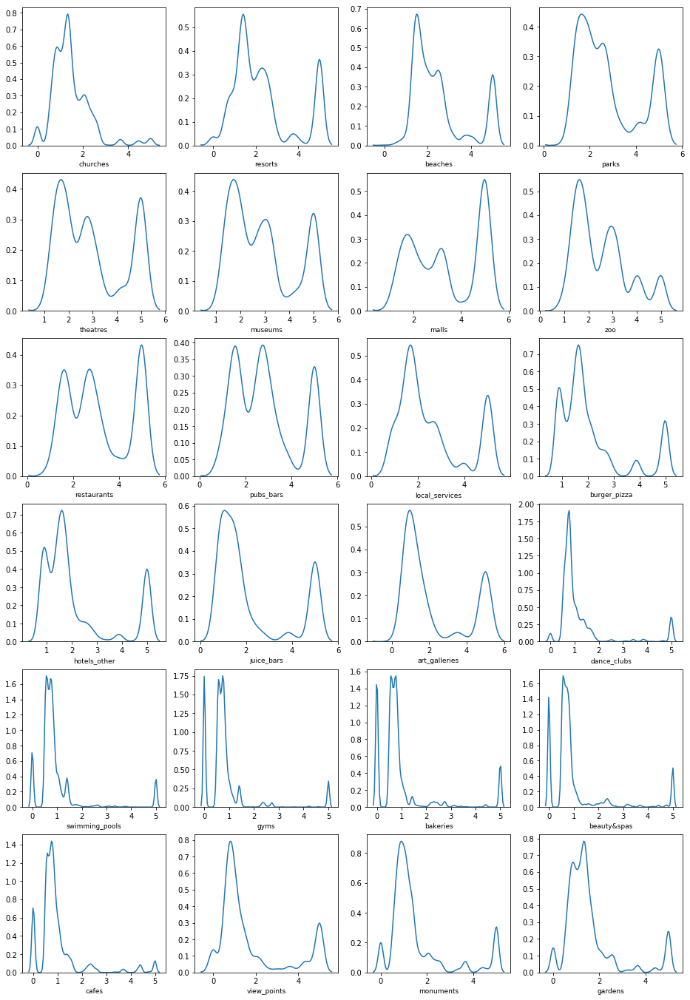

In [16]:
plt.figure(figsize=(16,24))
for i in range(len(df.columns)):
    plt.subplot(6,4,i+1),
    sns.distplot(df[df.columns[i]], hist=False)
    plt.xlabel(df.columns[i], fontsize=9)
plt.show()

此外，比對distribution plot後，又可以發現有些項目間的分布其實相似度頗高，例如：swimming_pools、gyms、bakeries和beauty&spas。

因此，評分的user有偏好上的不同的可能性會高一點。所以，先藉由correlation的heatmap大致看一下類別間分數的關聯。

由下面結果可以看到，的確有一些項目有不錯的關聯性。

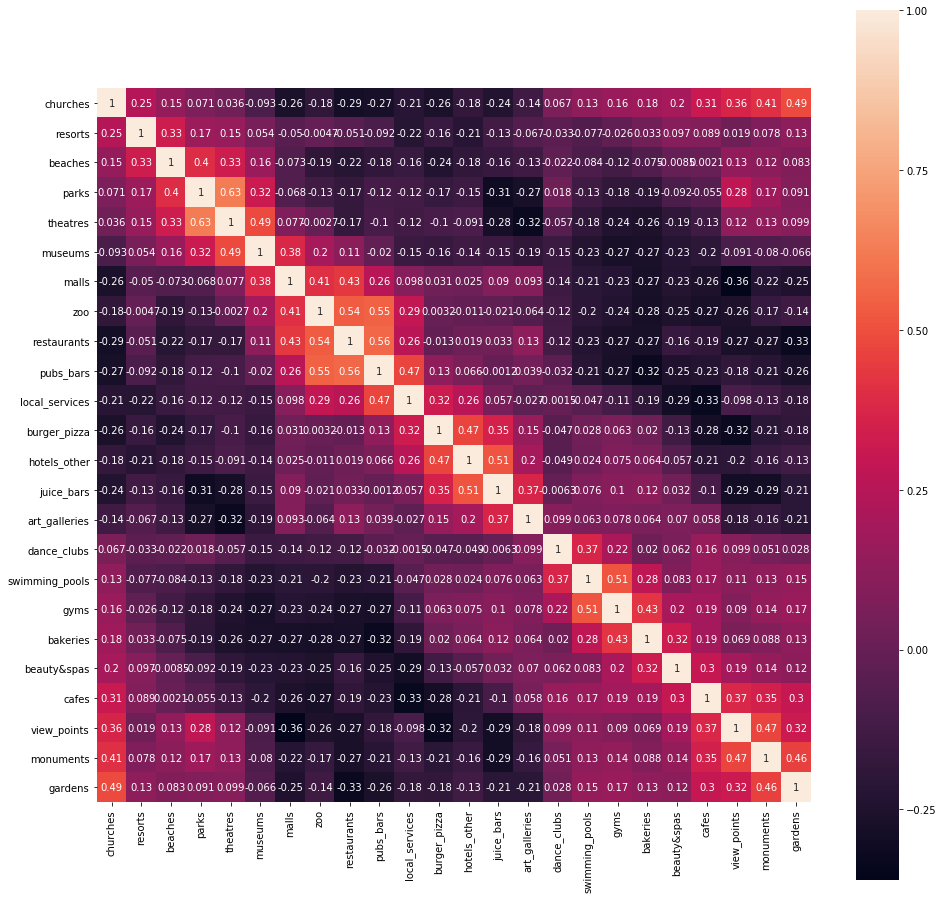

In [17]:
plt.figure(figsize=(16,16))
HeatMap = sns.heatmap ( df.corr() , square=True , annot=True ) 

## ．Hierarchical Clustering
由前面的分析結果，合理假設user的有評分有偏好上的差異。而這裡我選用Hierarchical Clustering來進行clustering。

首先繪製dendrogram

In [18]:
x_user = np.array([df.loc[row, :].values for row in df.index])

Wall time: 4.51 s


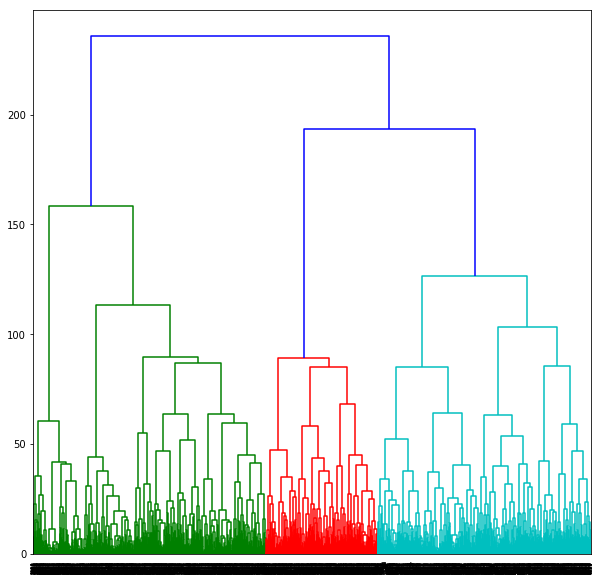

In [19]:
%%time
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,10))
dend_user = shc.dendrogram(shc.linkage(x_user, method='ward')) 

接下來進行Agglomerative Clustering

由前的dendrogram可以看出大致被分成3群。因此，這裡的cluster number先選用3，而linkage則運用ward's method。

In [20]:
from sklearn.cluster import AgglomerativeClustering

In [21]:
%%time
UserClustering = AgglomerativeClustering(linkage='ward', n_clusters=3).fit(x_user)

Wall time: 1.39 s


In [22]:
UserClustering      #檢視一下Parameters

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=3,
            pooling_func='deprecated')

### -Visualization
透過PCA降成二維並繪製成scatter plot

In [23]:
from sklearn.decomposition import PCA

In [24]:
y_cate = np.array(UserClustering.labels_)

In [25]:
pca = PCA(n_components=2) #降成二維
pca.fit(x_user) 
result = pca.transform(x_user) 
print(result)

[[-1.04699363 -2.5509083 ]
 [-1.09793068 -2.61894343]
 [-1.09999005 -2.61200404]
 ...
 [ 5.92495516  1.48535862]
 [ 4.71796179  2.88614472]
 [ 5.90125089  1.24500339]]


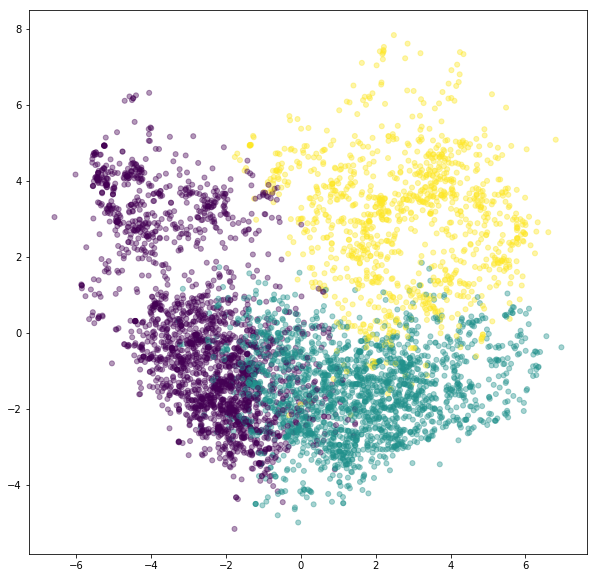

In [26]:
plt.figure(figsize=(10,10))
plt.scatter(result[:,0], result[:,1], c=y_cate, s=25, alpha=0.4, marker='o')

### -Different cluster number
將cluster number從2到6的clustering結果與2維視覺化的結果如下。

Wall time: 5.79 s


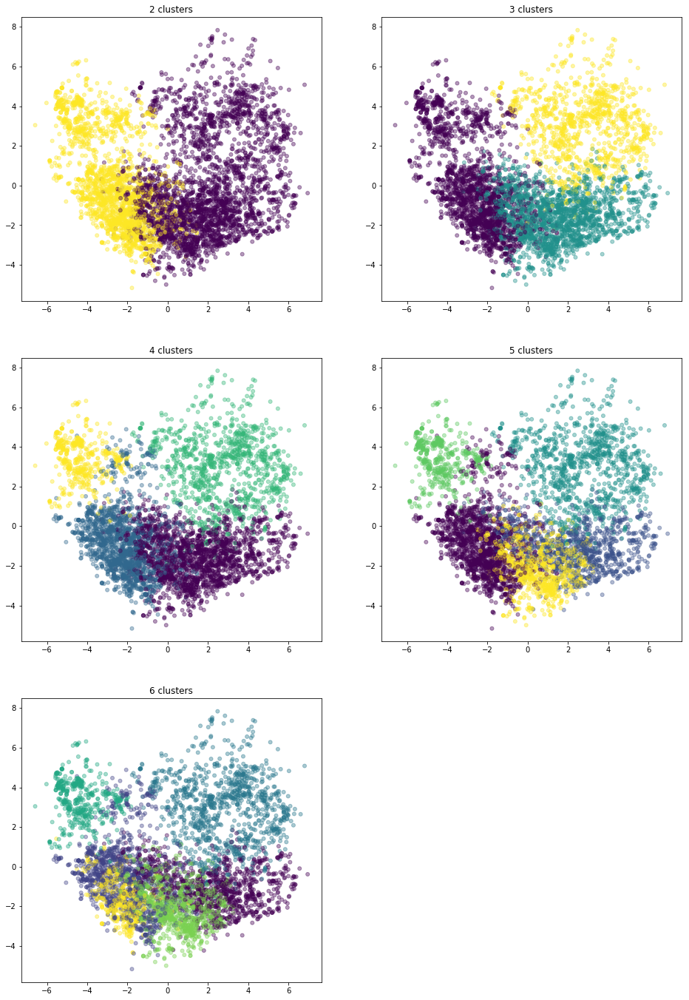

In [27]:
%%time
plt.figure(figsize=(16,24))
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='ward', n_clusters=i+2).fit(x_user)
    y_cate = np.array(UserClustering.labels_)
    pca = PCA(n_components=2) 
    pca.fit(x_user) 
    result = pca.transform(x_user) 
    plt.subplot(3,2,i+1)
    plt.title(str(i+2) + " clusters")
    plt.scatter(result[:,0], result[:,1], c=y_cate, s=25, alpha=0.4, marker='o')

由於原本為24維度的分析，降成二維的視覺化，可能無法呈現較真實的分群結果。因此，下面改成降成三維的視覺化，看是否能有較好的成像。

### -3D scatter plot
改降成三維並依據分類繪圖

In [28]:
from mpl_toolkits.mplot3d import Axes3D

Wall time: 5.71 s


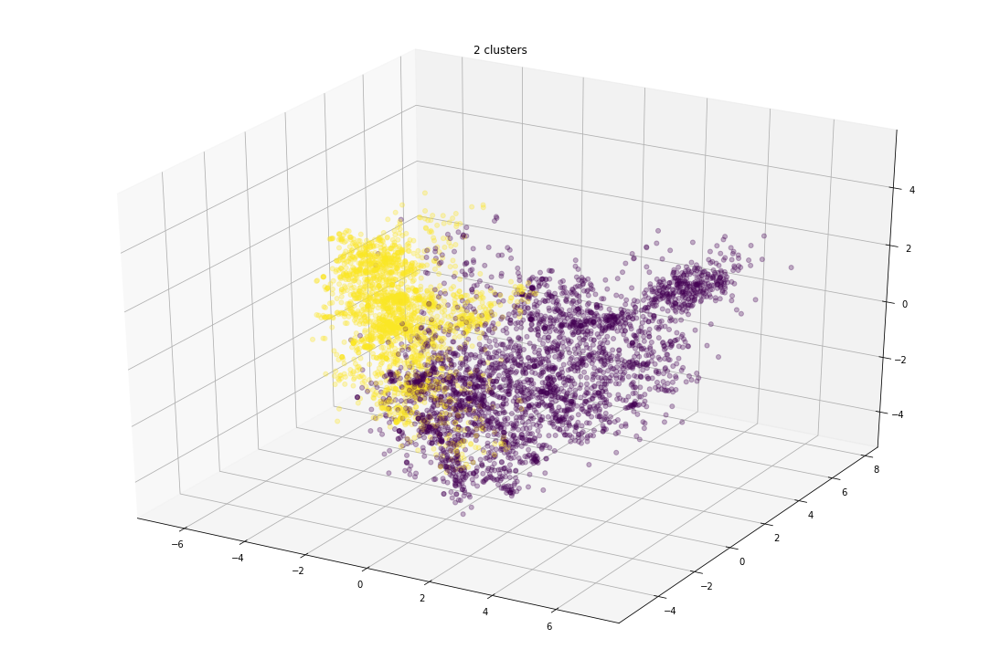

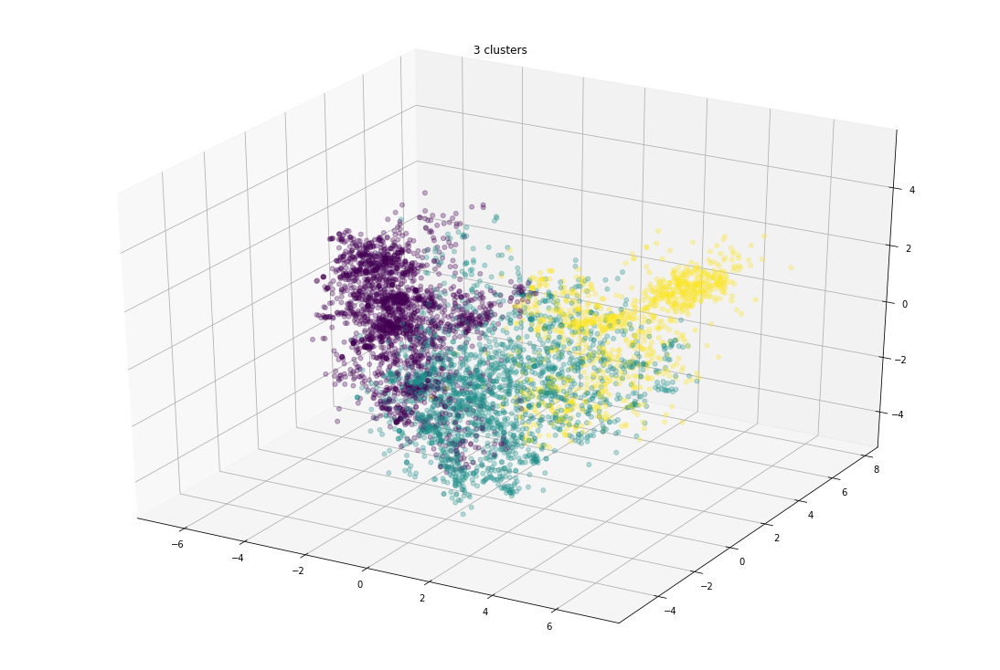

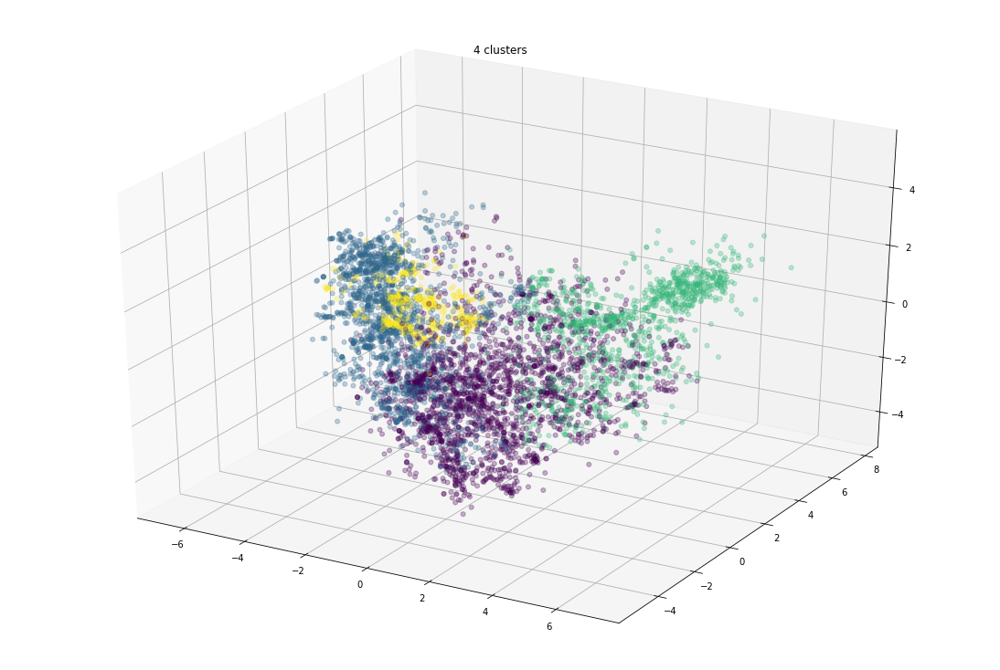

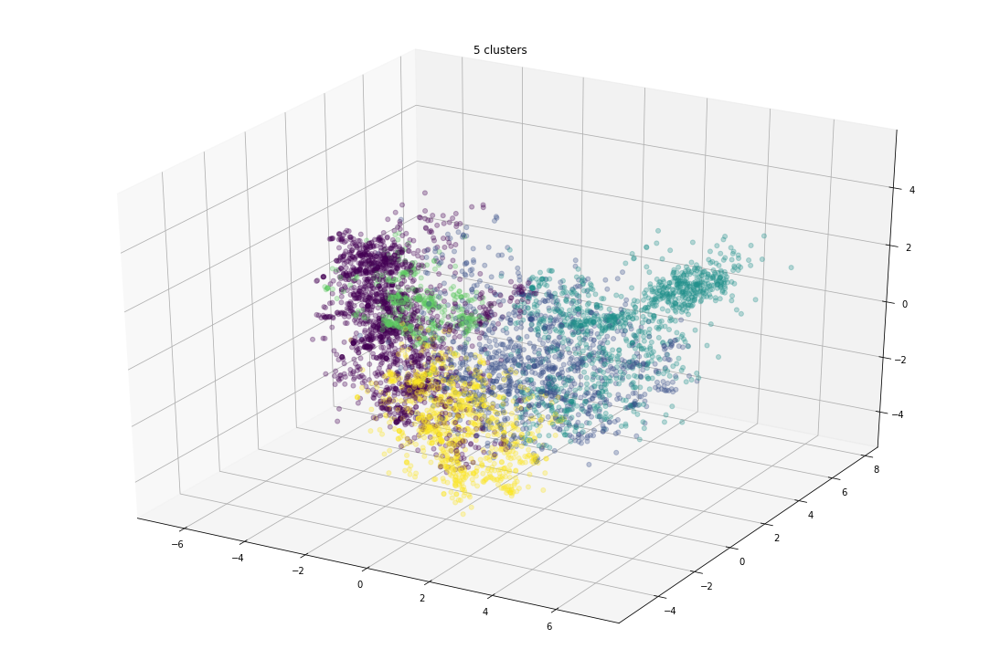

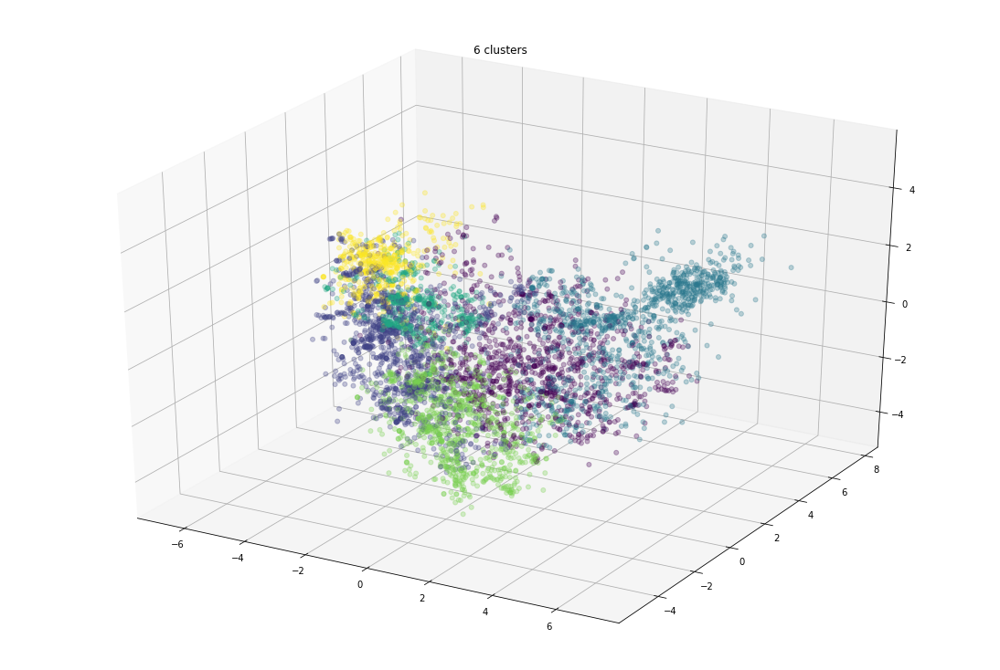

In [29]:
%%time
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='ward', n_clusters=i+2).fit(x_user)
    y_cate = np.array(UserClustering.labels_)
    pca = PCA(n_components=3) 
    pca.fit(x_user) 
    result = pca.transform(x_user) 
    fig = plt.figure(figsize=(15,10))
    ax = Axes3D(fig)
    plt.title(str(i+2) + " clusters")
    ax.scatter(result[:,0], result[:,1], result[:,2], c=y_cate, s=25, alpha=0.3, marker='o')

由三維的scatter plot還是無法有效判斷哪個cluster number比較理想，僅能大致看到cluster number為2、3或4的分群稍好。

因此，接下來利用其他方法分析。

### -Evaluation
在未知Ground truth的情形下，選用了Silhouette Coefficient及Calinski-Harabasz Index兩種方式，

並針對不同的linkage method及cluster number，進行performance的分析。

左邊為Silhouette Coefficient，右邊為Calinski-Harabasz Index。

#### linkage='ward'

In [30]:
%%time
from sklearn import metrics
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='ward', n_clusters=i+2).fit(x_user)
    y_cate = np.array(UserClustering.labels_)
    print(str(i+2) + " clusters: ", end="")
    print(metrics.silhouette_score(x_user, y_cate, metric='euclidean'),end=", ")
    print(metrics.calinski_harabaz_score(x_user, y_cate))

2 clusters: 0.12292652963138584, 806.4211098605593
3 clusters: 0.12866906251090274, 749.8050758552891
4 clusters: 0.12777979113809249, 685.0277649242215
5 clusters: 0.11388548673680125, 614.6312665132247
6 clusters: 0.10950089541798749, 563.0170042446715
Wall time: 8.04 s


#### linkage='complete'

In [31]:
%%time
from sklearn import metrics
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='complete', n_clusters=i+2).fit(x_user)
    y_cate = np.array(UserClustering.labels_)
    print(str(i+2) + " clusters: ", end="")
    print(metrics.silhouette_score(x_user, y_cate, metric='euclidean'),end=", ")
    print(metrics.calinski_harabaz_score(x_user, y_cate))

2 clusters: 0.08944438005667307, 546.2616607630717
3 clusters: 0.09740341022267056, 568.2468322639342
4 clusters: 0.09684327838193335, 547.9296442168321
5 clusters: 0.08973807548314464, 493.09356379933985
6 clusters: 0.09931252877084028, 503.02046181826825
Wall time: 7.31 s


#### linkage='average'

In [32]:
%%time
from sklearn import metrics
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='average', n_clusters=i+2).fit(x_user)
    y_cate = np.array(UserClustering.labels_)
    print(str(i+2) + " clusters: ", end="")
    print(metrics.silhouette_score(x_user, y_cate, metric='euclidean'),end=", ")
    print(metrics.calinski_harabaz_score(x_user, y_cate))

2 clusters: 0.1760931009931882, 10.218862664364398
3 clusters: 0.08737170226761515, 49.03000396982203
4 clusters: 0.0759864069280462, 34.337097614202484
5 clusters: 0.0788770757661322, 163.11663425409174
6 clusters: 0.12537989666027868, 306.69852073111855
Wall time: 7.48 s


#### linkage='single'

In [33]:
%%time
from sklearn import metrics
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='single', n_clusters=i+2).fit(x_user)
    y_cate = np.array(UserClustering.labels_)
    print(str(i+2) + " clusters: ", end="")
    print(metrics.silhouette_score(x_user, y_cate, metric='euclidean'),end=", ")
    print(metrics.calinski_harabaz_score(x_user, y_cate))

2 clusters: 0.19454190263550025, 3.936535834689237
3 clusters: 0.12290250044695043, 2.895580937697957
4 clusters: 0.08337567620903674, 2.663228668940159
5 clusters: 0.07095536314389625, 3.741971722386595
6 clusters: 0.05515845890248111, 3.3717843538995584
Wall time: 5.23 s


### -Result
由前面的結果可以看出，評分的user大致上有分群。試圖改善cluster的performanace後，發現以Ward's method的clustering結果較佳。
其中，又以cluster number為3時最好。

而由圖像化的結果，猜測noise可能有點高，因此接下來改用DBSCAN的方式來做clustering，看能否改善分群表現。

## ．DBSCAN
將eps由1.1至10.0，每次增加0.1；min_samples則由2到5，進行clustering並記錄評估結果

In [34]:
%%time
from sklearn.cluster import DBSCAN
from tqdm import tqdm

NForE = 91

scores_s = []
scores_ch = []
epses = np.linspace(start=1 , stop=10, num=NForE)
with tqdm(total=NForE*4) as progress_bar:
    for i in range(4) :
        for e in epses:
            D_UserClustering = DBSCAN(eps=e, min_samples=i+2).fit(x_user)
            y_cate_d = np.array(D_UserClustering.labels_)
            if y_cate_d.sum() == 0:
                score_s = 0
                score_ch = 0
            else:
                score_s = metrics.silhouette_score(x_user, y_cate_d, metric='euclidean')
                score_ch = metrics.calinski_harabaz_score(x_user, y_cate_d)
            scores_s.append(score_s)
            scores_ch.append(score_ch)
            progress_bar.update()

100%|████████████████████████████████████████████████████████████████████████████████| 364/364 [17:18<00:00,  3.76s/it]


Wall time: 17min 18s


找出分數最高時的parameters

In [35]:
import math
best_epses_s = epses[np.argmax(scores_s)%NForE]
best_min_sample_s = (math.ceil(np.argmax(scores_s)/NForE))+1
best_epses_ch = epses[np.argmax(scores_ch)%NForE]
best_min_sample_ch = (math.ceil(np.argmax(scores_ch)/NForE))+1

### -silhouette score最高時的視覺化
大部分的點都屬於其中一個cluster，且其calinski harabaz score遠低於前面使用Hierarchical Clustering的最佳結果。

0.26900435419089785, 17.82138353156835


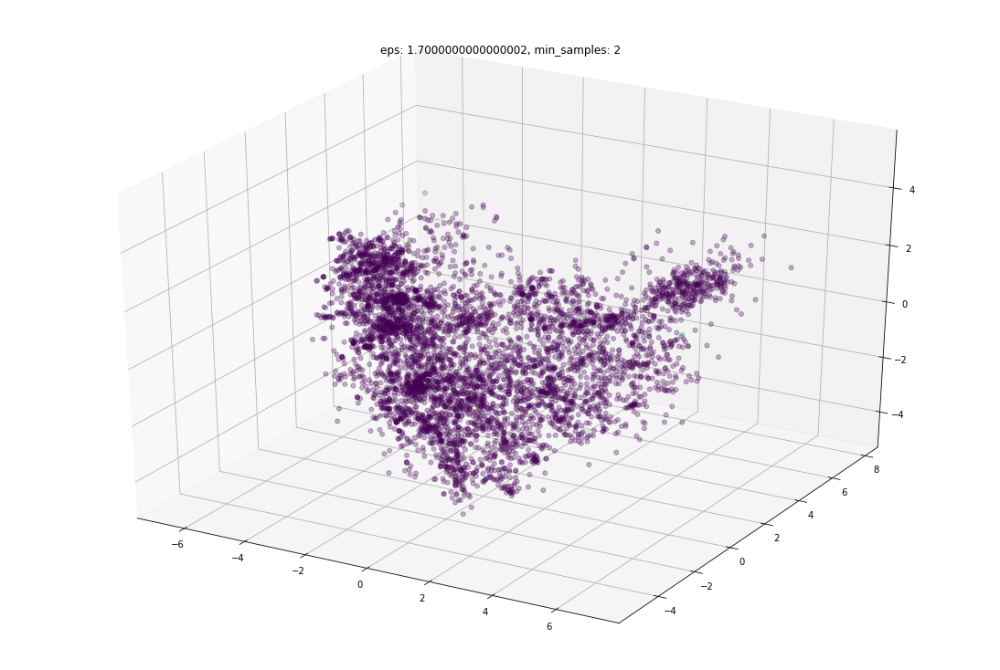

In [36]:
D_UserClustering = DBSCAN(eps=best_epses_s, min_samples=best_min_sample_s).fit(x_user)
y_cate_d = np.array(D_UserClustering.labels_)
pca_d = PCA(n_components=3)
pca_d.fit(x_user) 
result_d = pca_d.transform(x_user) 
fig = plt.figure(figsize=(15,10))
ax_d = Axes3D(fig)
plt.title("eps: "+ str(best_epses_s) + ", min_samples: " + str(best_min_sample_s))
ax_d.scatter(result_d[:,0], result_d[:,1], result_d[:,2], c=y_cate, s=25, alpha=0.3, marker='o')
print(metrics.silhouette_score(x_user, y_cate_d, metric='euclidean'),end=", ")
print(metrics.calinski_harabaz_score(x_user, y_cate_d))

### -calinski harabaz score最高時的視覺化
大部分的點也都屬於其中一個cluster，且其calinski harabaz score亦遠低於前面使用Hierarchical Clustering的最佳結果。

0.0570785075812343, 46.792430894736064


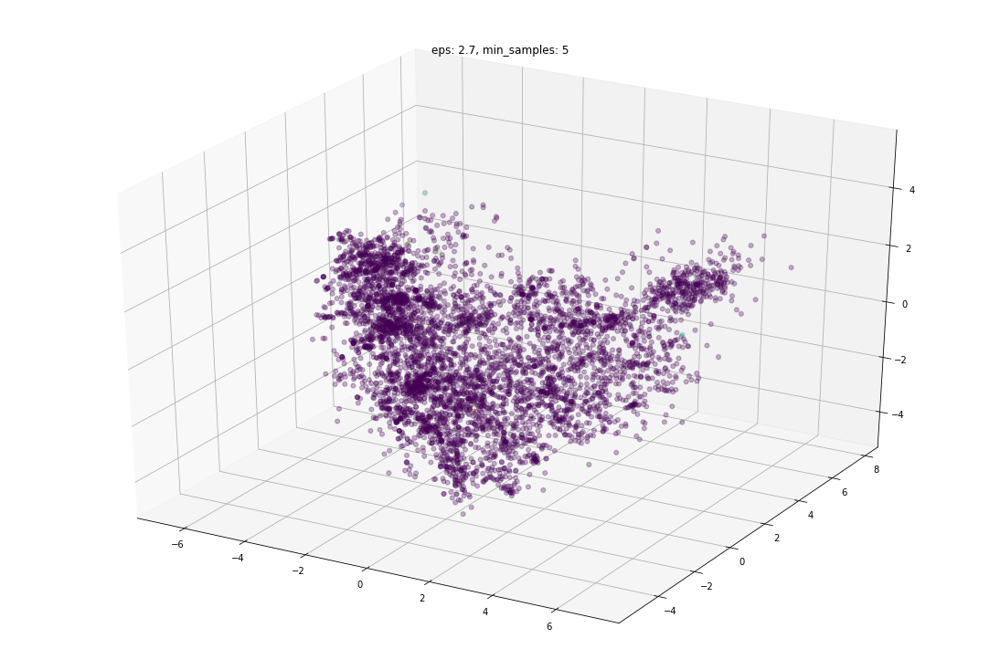

In [37]:
D_UserClustering = DBSCAN(eps=best_epses_ch, min_samples=best_min_sample_ch).fit(x_user)
y_cate_d = np.array(D_UserClustering.labels_)
pca_d = PCA(n_components=3)
pca_d.fit(x_user) 
result_d = pca_d.transform(x_user) 
fig = plt.figure(figsize=(15,10))
ax_d = Axes3D(fig)
plt.title("eps: "+ str(best_epses_ch) + ", min_samples: " + str(best_min_sample_ch))
ax_d.scatter(result_d[:,0], result_d[:,1], result_d[:,2], c=y_cate, s=25, alpha=0.3, marker='o')
print(metrics.silhouette_score(x_user, y_cate_d, metric='euclidean'),end=", ")
print(metrics.calinski_harabaz_score(x_user, y_cate_d))

### -Result
由上述分析結果，可以看出DBSCAN在這裡並不適合拿來做clustering，所做出來的cluser以Silhouette Coefficient和Calinski-Harabasz Index分析，
都可以看出performance基本上都比Hierarchical Clustering差。

因此，最後又轉為嘗試K-Means clistering。

## ．K-means
不同cluster munber下的K-Means clistering performance如下，左邊為Silhouette Coefficient，右邊為Calinski-Harabasz Index。

可以看出在同樣的cluster munber下K-Means clistering的performance相對較Hierarchical Clustering好。

In [38]:
%%time
from sklearn.cluster import KMeans
for i in range(5):
    K_UserClustering = KMeans(n_clusters=i+2).fit(x_user)
    y_cate_k = np.array(K_UserClustering.labels_)
    print(str(i+2) + " clusters: ", end="")
    print(metrics.silhouette_score(x_user, y_cate_k, metric='euclidean'),end=", ")
    print(metrics.calinski_harabaz_score(x_user, y_cate_k))

2 clusters: 0.14431049573608823, 945.040071679413
3 clusters: 0.14446884639701774, 827.9497270920842
4 clusters: 0.14706161545540278, 780.7272915425865
5 clusters: 0.1522575929749299, 714.5251726683417
6 clusters: 0.15010573032001925, 659.013643141546
Wall time: 3.76 s


### -Visualize
cluster munber由2至6的三維圖示如下。

Wall time: 1.5 s


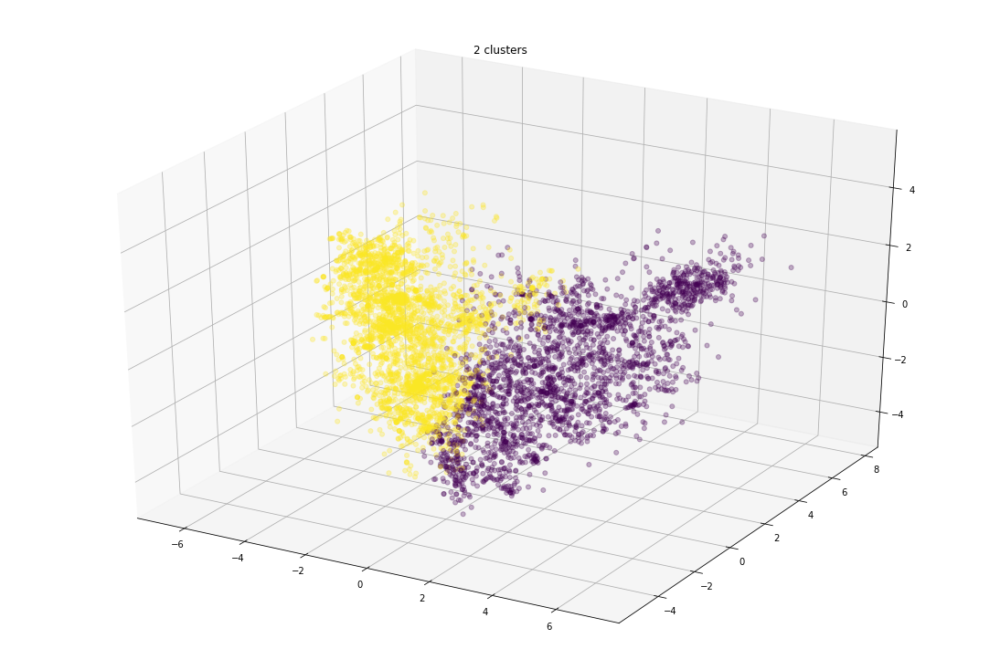

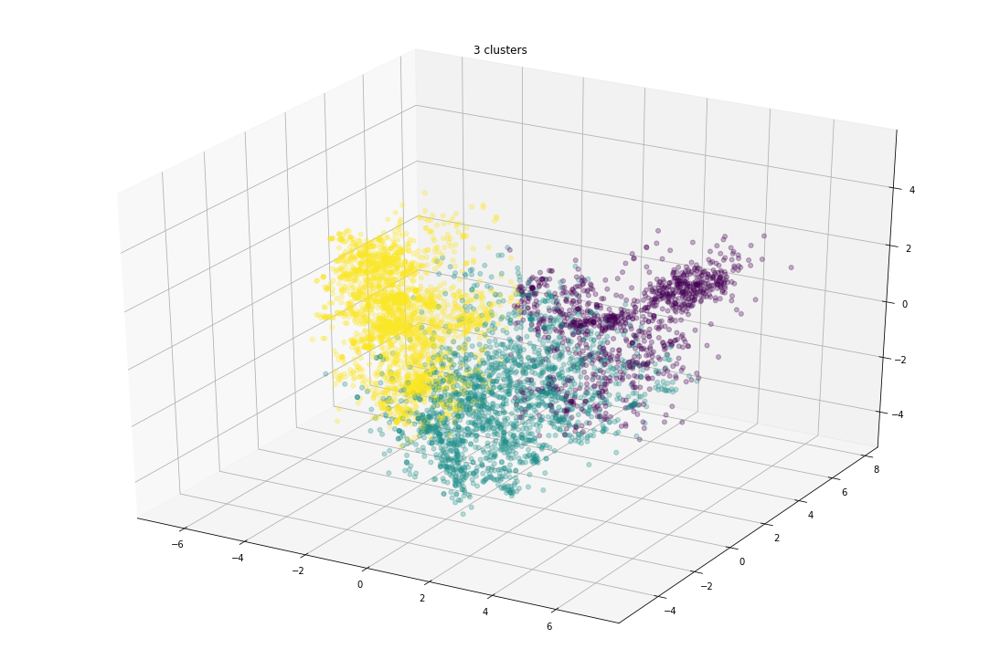

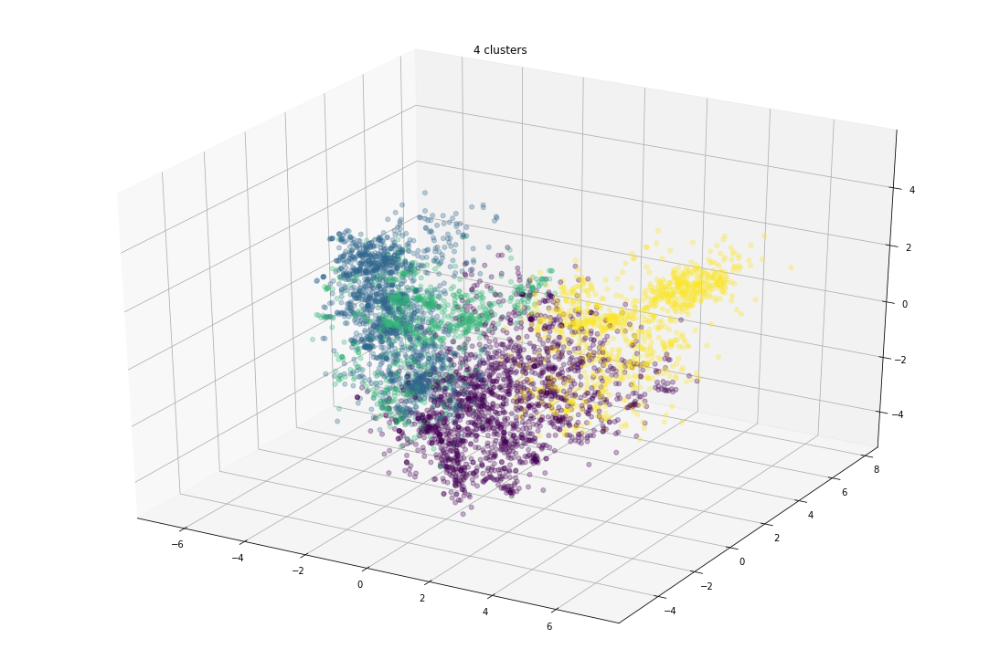

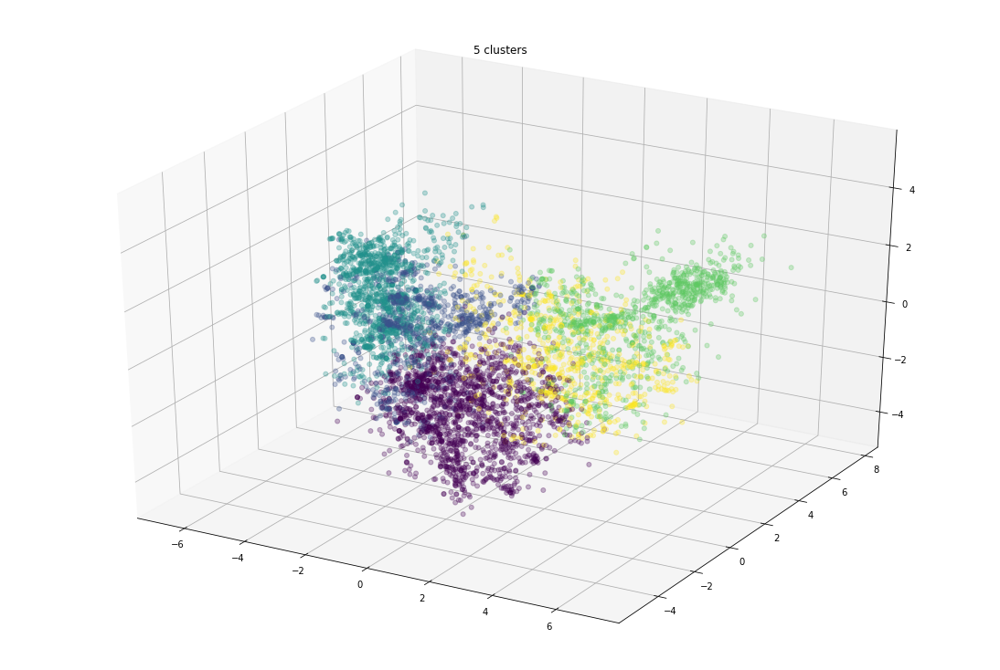

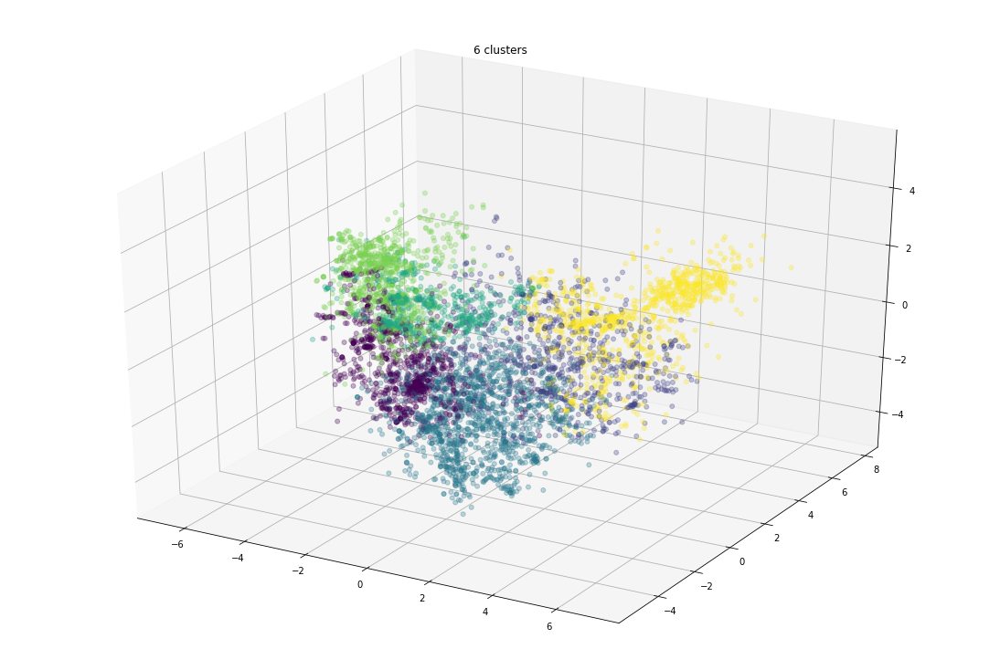

In [39]:
%%time
for i in range(5):
    K_UserClustering = KMeans(n_clusters=i+2).fit(x_user)
    y_cate_k = np.array(K_UserClustering.labels_)
    pca = PCA(n_components=3) 
    pca.fit(x_user) 
    result = pca.transform(x_user) 
    fig = plt.figure(figsize=(15,10))
    ax = Axes3D(fig)
    plt.title(str(i+2) + " clusters")
    ax.scatter(result[:,0], result[:,1], result[:,2], c=y_cate_k, s=25, alpha=0.3, marker='o')

### -Result
看出在同樣的cluster munber下K-Means clistering的performance相對較Hierarchical Clustering好。

而由視覺化的結果亦可以看出，K-Means clistering的分界較Hierarchical Clustering清楚一些。

但是哪個cluster munber的cluster較好，卻也無法直接就這樣下定論。

# Discussion
由Hierarchical Clustering及K-Means clistering的結果，算是初步證實了前面的假設，user的評分模式是可以分群的。

也就是說user大致可以歸類出數種評分趨勢。只是"數種"是幾種，就無法做有效地確認。僅可以由Silhouette Coefficient和Calinski-Harabasz Index的分析結果，與視覺化呈現的結果，推測2~4個cluster為較理想的分群。

若是要再進一步改善Clustering的表現，增加Attribute可能是一個不錯的方法，例如：國籍、性別、年齡等。

此外user的評分標準化也可能一個不錯的方式。接下來就針對user的評分進行標準化。

## Scale the data to unit variance
這裡採用的模式是將各user的評分獨自標準化

In [40]:
from sklearn.preprocessing import scale
df_std = df

for row in df.index:
    df_std.loc[row] = scale(df_std.loc[row])

In [41]:
x_user_std = np.array([df_std.loc[row, :].values for row in df_std.index])

### Agglomerative Clustering

In [42]:
%%time
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='ward', n_clusters=i+2).fit(x_user_std)
    y_cate_std = np.array(UserClustering.labels_)
    print(str(i+2) + " clusters: ", end="")
    print(metrics.silhouette_score(x_user_std, y_cate_std, metric='euclidean'),end=", ")
    print(metrics.calinski_harabaz_score(x_user_std, y_cate_std))

2 clusters: 0.11415474198463138, 753.9784127476477
3 clusters: 0.12150326864464044, 742.5324159587202
4 clusters: 0.10507959436507987, 652.665449444736
5 clusters: 0.09283432400637703, 580.274121346863
6 clusters: 0.10359873957968276, 530.11370541444
Wall time: 8.48 s


Wall time: 6.71 s


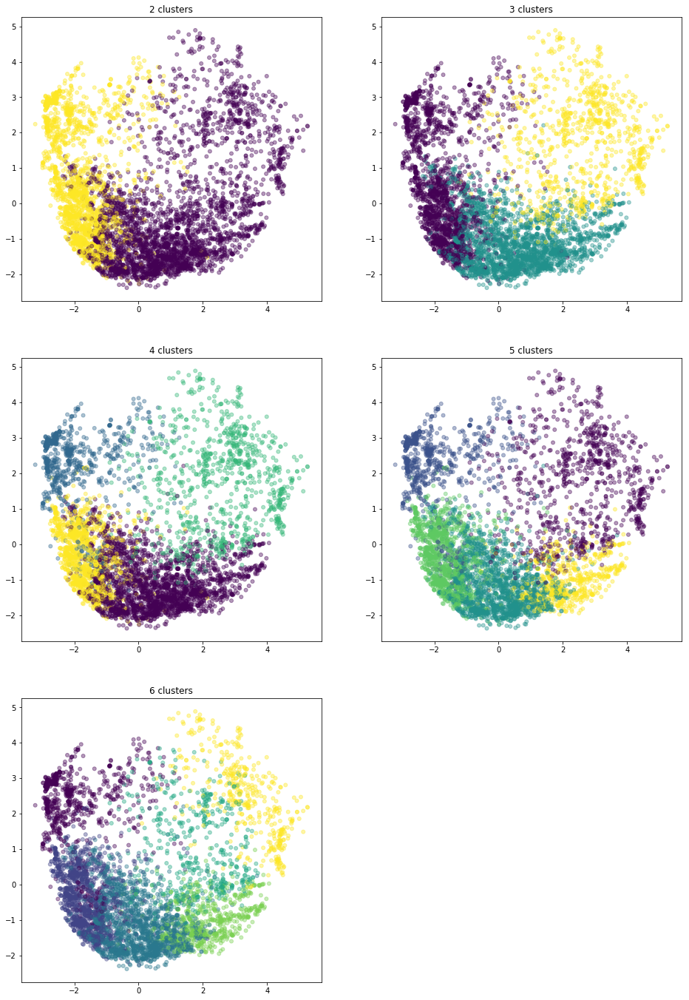

In [43]:
%%time
plt.figure(figsize=(16,24))
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='ward', n_clusters=i+2).fit(x_user_std)
    y_cate_std = np.array(UserClustering.labels_)
    pca = PCA(n_components=2) 
    pca.fit(x_user_std) 
    result = pca.transform(x_user_std) 
    plt.subplot(3,2,i+1)
    plt.title(str(i+2) + " clusters")
    plt.scatter(result[:,0], result[:,1], c=y_cate_std, s=25, alpha=0.4, marker='o')

Wall time: 6.22 s


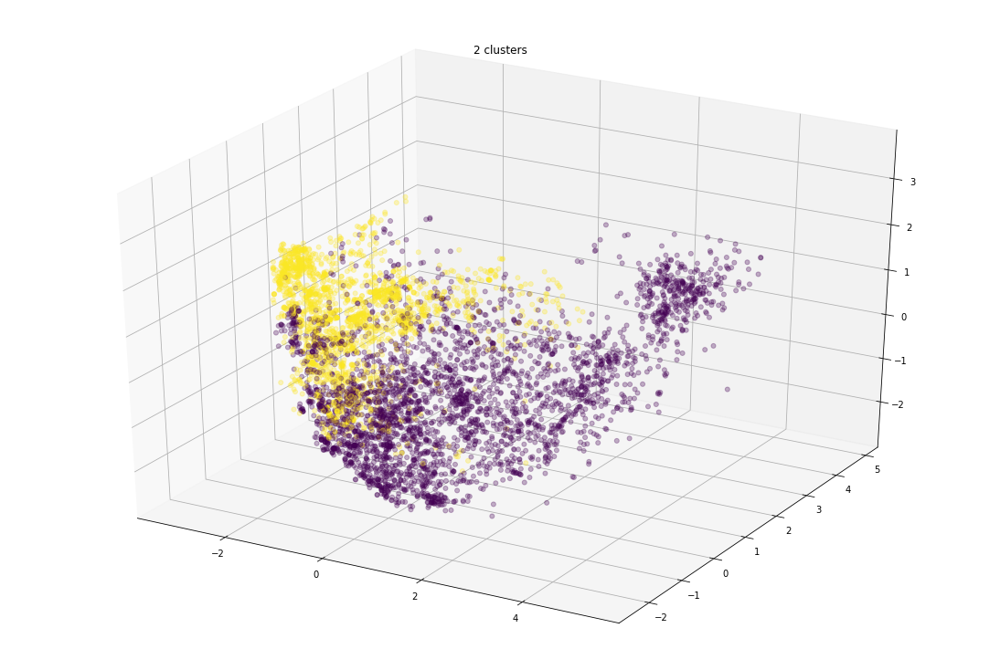

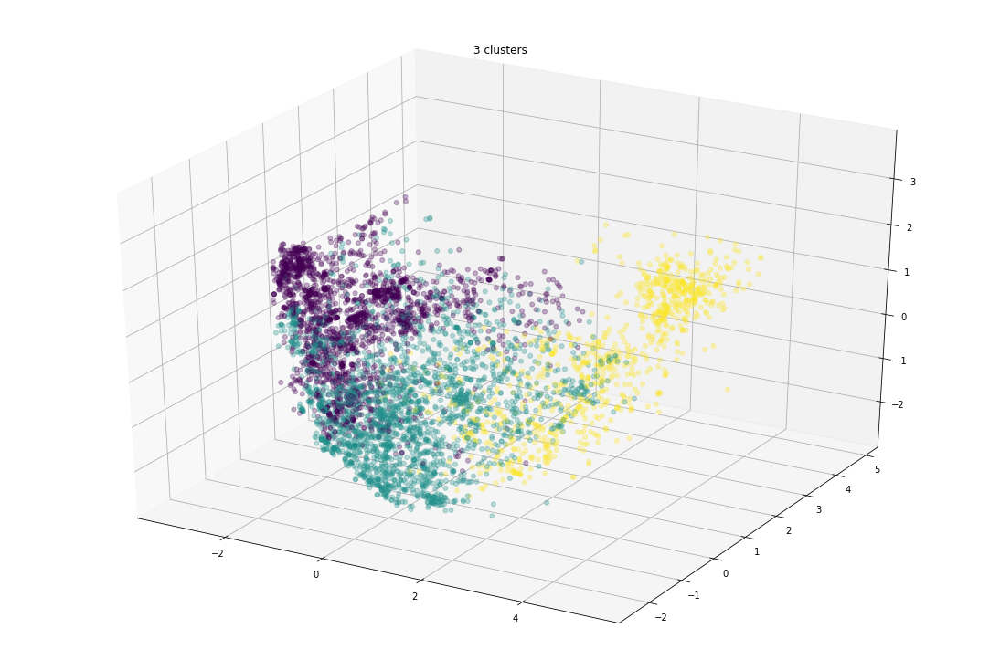

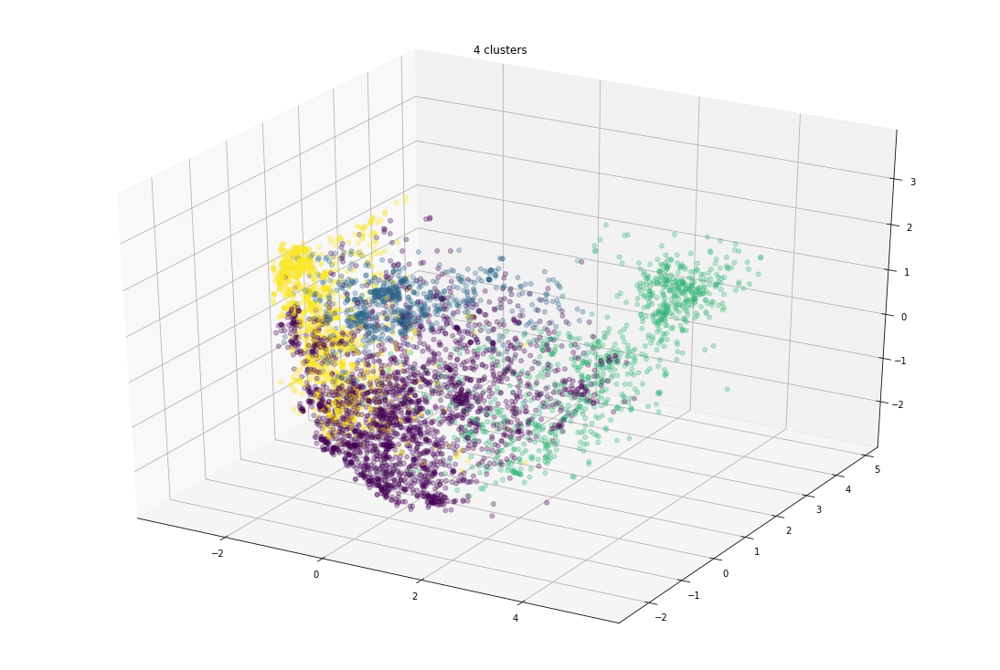

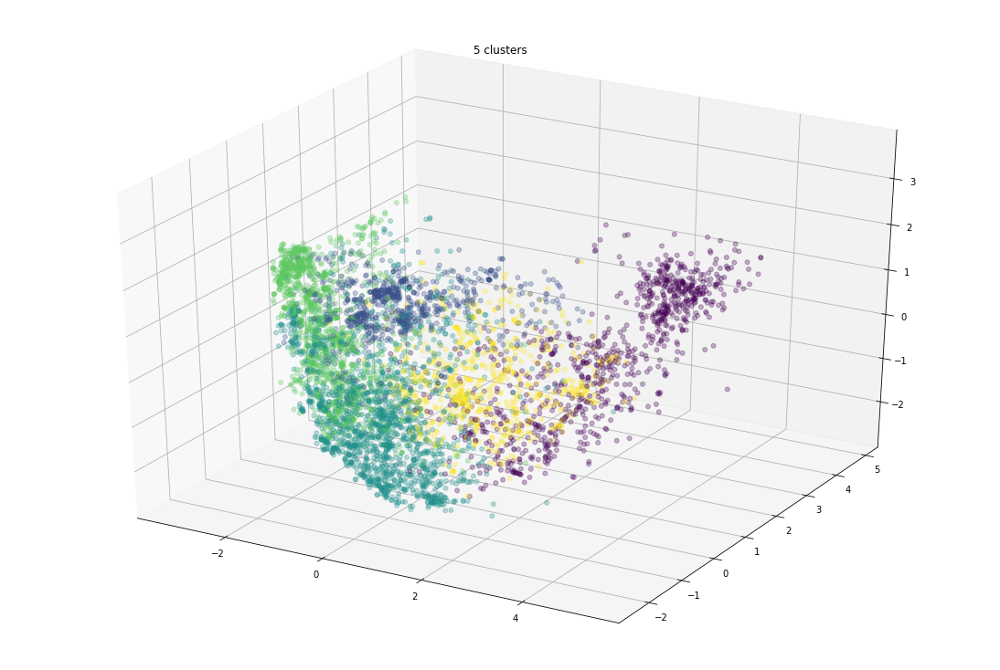

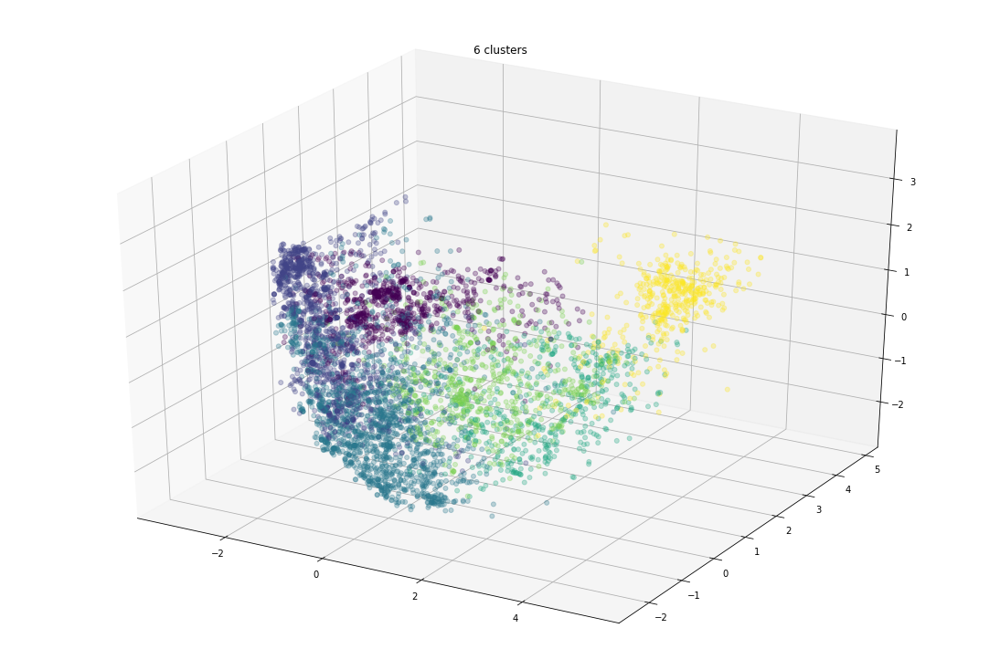

In [44]:
%%time
for i in range(5):
    UserClustering = AgglomerativeClustering(linkage='ward', n_clusters=i+2).fit(x_user_std)
    y_cate_std = np.array(UserClustering.labels_)
    pca = PCA(n_components=3) 
    pca.fit(x_user_std) 
    result = pca.transform(x_user_std) 
    fig = plt.figure(figsize=(15,10))
    ax = Axes3D(fig)
    plt.title(str(i+2) + " clusters")
    ax.scatter(result[:,0], result[:,1], result[:,2], c=y_cate_std, s=25, alpha=0.3, marker='o')

### K-Means

In [45]:
%%time
from sklearn.cluster import KMeans
for i in range(5):
    K_UserClustering = KMeans(n_clusters=i+2).fit(x_user_std)
    y_cate_std = np.array(K_UserClustering.labels_)
    print(str(i+2) + " clusters: ", end="")
    print(metrics.silhouette_score(x_user_std, y_cate_std, metric='euclidean'),end=", ")
    print(metrics.calinski_harabaz_score(x_user_std, y_cate_std))

2 clusters: 0.15516932717935197, 956.1787749475892
3 clusters: 0.14155689175314679, 841.8836237506581
4 clusters: 0.13626324362143966, 777.6226127818909
5 clusters: 0.13791444059224134, 704.4701396041813
6 clusters: 0.132461401808899, 644.754568607765
Wall time: 4.11 s


Wall time: 1.46 s


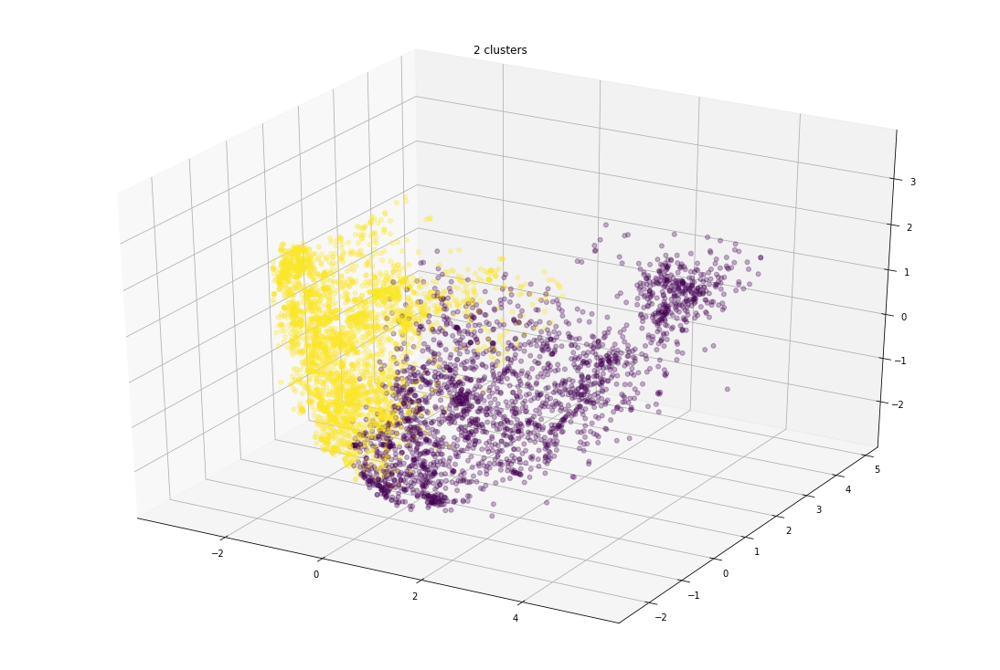

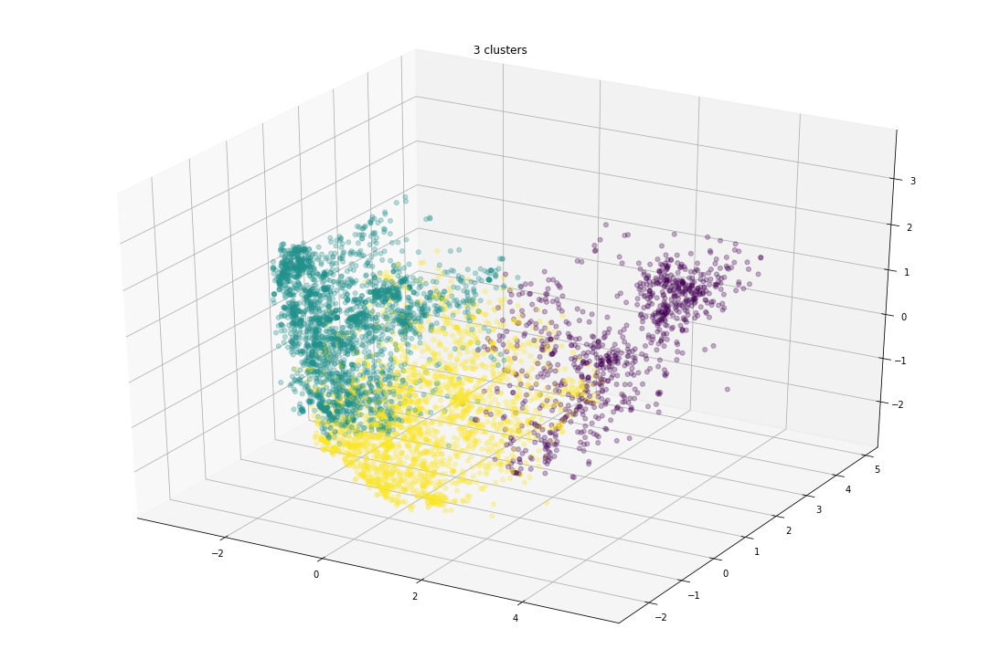

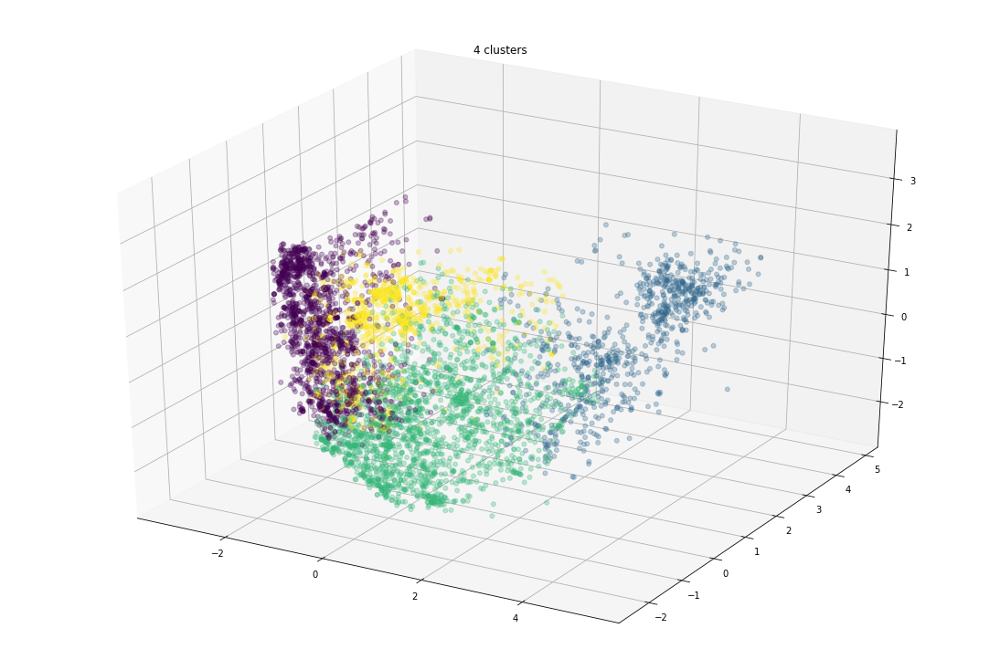

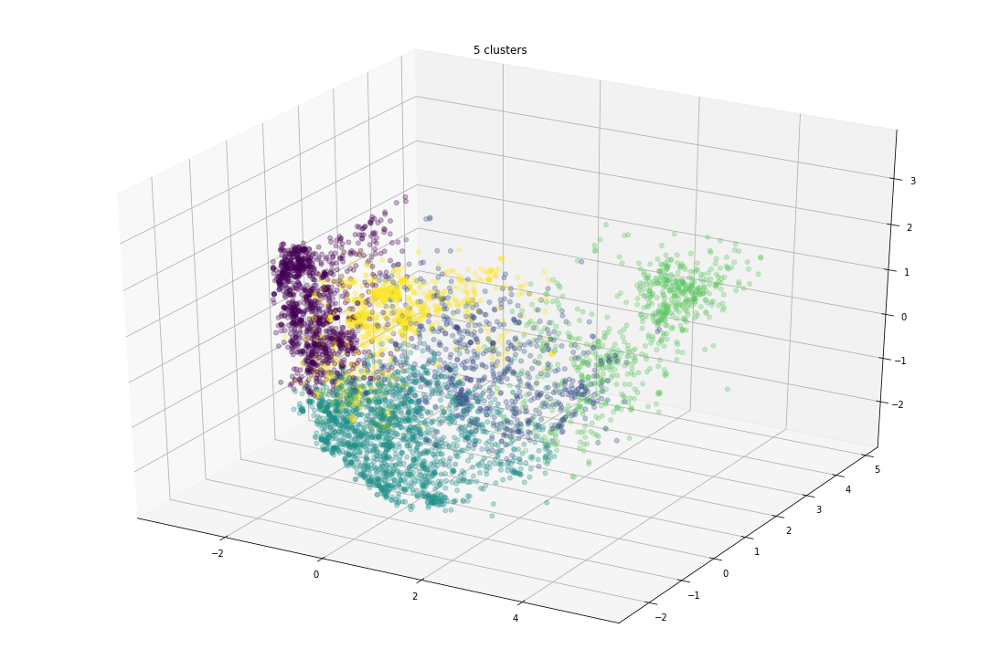

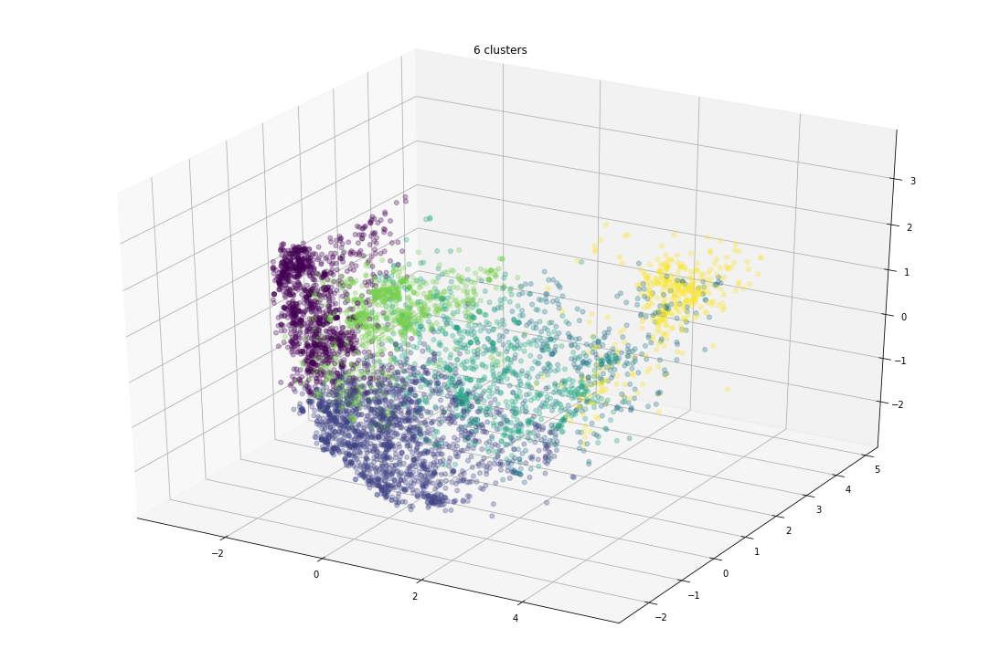

In [46]:
%%time
for i in range(5):
    K_UserClustering = KMeans(n_clusters=i+2).fit(x_user_std)
    y_cate_std = np.array(K_UserClustering.labels_)
    pca = PCA(n_components=3) 
    pca.fit(x_user_std) 
    result = pca.transform(x_user_std) 
    fig = plt.figure(figsize=(15,10))
    ax = Axes3D(fig)
    plt.title(str(i+2) + " clusters")
    ax.scatter(result[:,0], result[:,1], result[:,2], c=y_cate_std, s=25, alpha=0.3, marker='o')

### Result
由於DBSCAN原本的cluster結果相當不理想，所以這裡就只針對Agglomerative clustering與K-Means clustering做嘗試。
以Silhouette Coefficient和Calinski-Harabasz Index的分析clustering結果，可以發現標準化後並埋有太大幅度的改善。而視覺化呈現的結果也是如此。